###  Set up Kaggle API and Download CelebA

In [1]:
# Upload kaggle.json first
from google.colab import files
files.upload()

# Setup Kaggle API
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download CelebA dataset
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip -q celeba-dataset.zip -d celeba


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 99% 1.31G/1.33G [00:07<00:00, 93.2MB/s]
100% 1.33G/1.33G [00:07<00:00, 186MB/s] 


### Setup

In [2]:
import os
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image

# Constants
IMG_SIZE = 64
BATCH_SIZE = 64
LATENT_DIM = 100
EPOCHS = 100

### Import Libraries and Preprocess Images

In [3]:
def preprocess_celeba(image_paths, image_size=(64, 64)):
    images = []
    for img_path in image_paths:
        img = Image.open(img_path).resize(image_size).convert('RGB')
        img = np.asarray(img).astype(np.float32)
        img = (img - 127.5) / 127.5
        images.append(img)
    return np.array(images)

# Load images
image_paths = glob('celeba/img_align_celeba/img_align_celeba/*.jpg')[:50000]
data = preprocess_celeba(image_paths)
print("Shape of data:", data.shape)


Shape of data: (50000, 64, 64, 3)


### Ploting some Random Sample

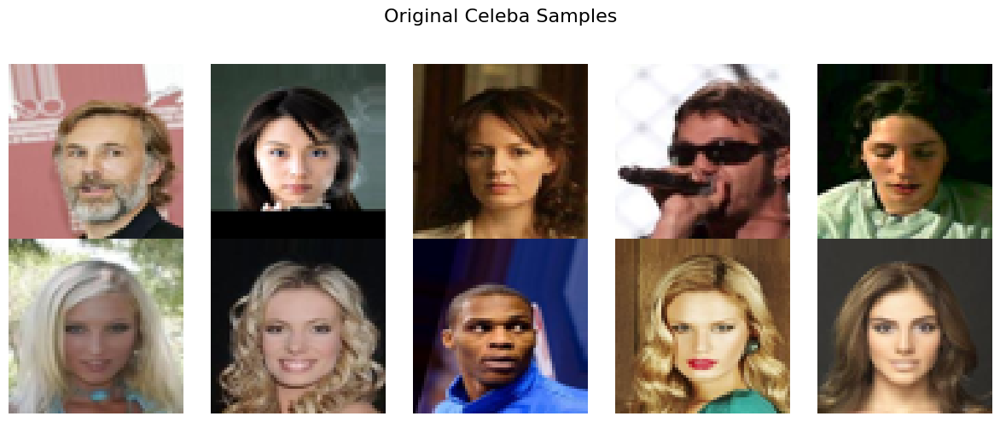

In [4]:
import matplotlib.pyplot as plt

def plot_original_samples(data, num_images=10):
    plt.figure(figsize=(12, 5))
    for i in range(num_images):
        plt.subplot(2, 5, i + 1)
        img = (data[i] + 1) / 2.0  # Rescale to [0, 1]
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle("Original Celeba Samples", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_original_samples(data)


###  Generator + Discriminator of DCGAN Model

In [5]:
# Generator
def build_generator(latent_dim=100):
    return tf.keras.Sequential([
        layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(latent_dim,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Reshape((8, 8, 256)),

        layers.Conv2DTranspose(128, kernel_size=5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', use_bias=False, activation='tanh')
    ], name="Generator")

# Discriminator
def build_discriminator(img_size=64):
    return tf.keras.Sequential([
        layers.Conv2D(64, kernel_size=5, strides=2, padding='same', input_shape=(img_size, img_size, 3)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, kernel_size=5, strides=2, padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ], name="Discriminator")

generator = build_generator()
discriminator = build_discriminator()
generator.summary()
discriminator.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16384)          │     1,638,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16384)          │        65,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 128)    │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 64)     │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 3)      │         4,800 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,733,504 (10.43 MB)

 Trainable params: 2,700,352 (10.30 MB)

 Non-trainable params: 33,152 (129.50 KB)

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        32,769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 242,561 (947.50 KB)

 Trainable params: 242,561 (947.50 KB)

 Non-trainable params: 0 (0.00 B)

### Define Training Loop

In [6]:
# Loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Prepare dataset
dataset = tf.data.Dataset.from_tensor_slices(data).shuffle(10000).batch(BATCH_SIZE)


### Training + Generate Images

Epoch 1/100 | Generator Loss: 2.4623 | Discriminator Loss: 0.6087


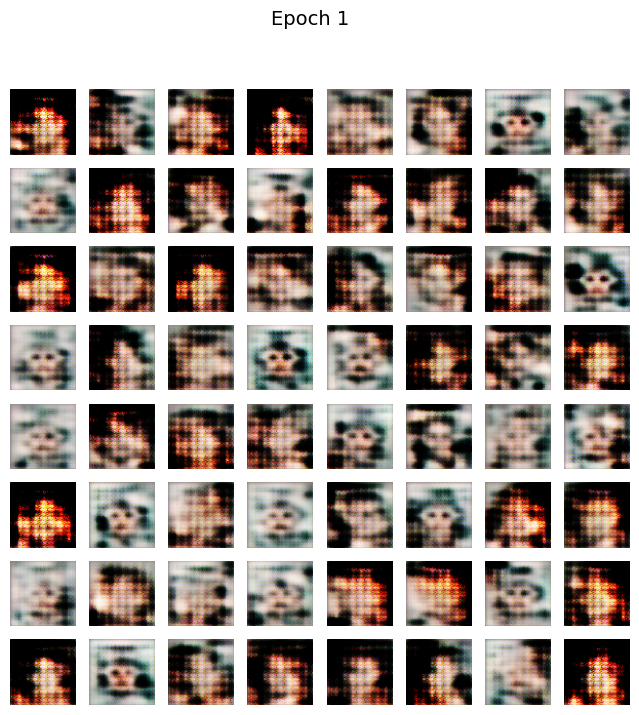

Epoch 2/100 | Generator Loss: 1.3666 | Discriminator Loss: 0.9493
Epoch 3/100 | Generator Loss: 1.2241 | Discriminator Loss: 1.0523
Epoch 4/100 | Generator Loss: 1.2934 | Discriminator Loss: 0.9879
Epoch 5/100 | Generator Loss: 1.2403 | Discriminator Loss: 1.0142


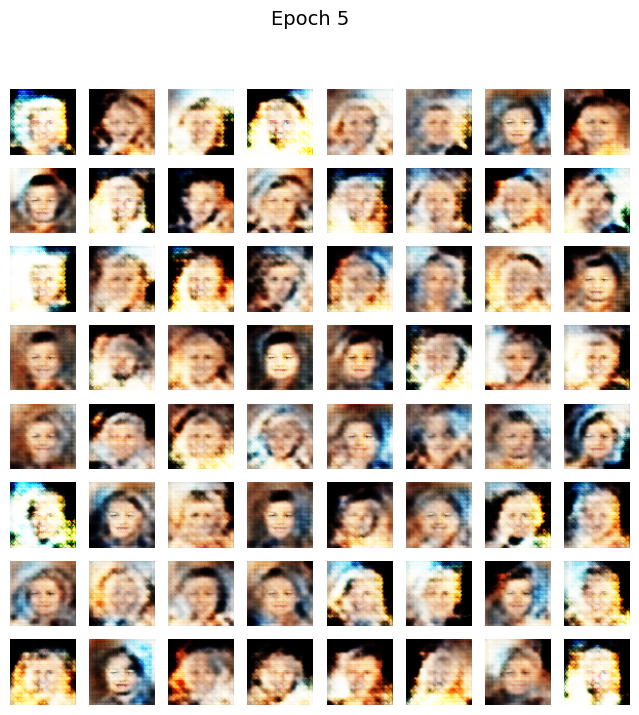

Epoch 6/100 | Generator Loss: 1.2885 | Discriminator Loss: 1.0017
Epoch 7/100 | Generator Loss: 1.3680 | Discriminator Loss: 0.9710
Epoch 8/100 | Generator Loss: 1.3596 | Discriminator Loss: 0.9973
Epoch 9/100 | Generator Loss: 1.3710 | Discriminator Loss: 0.9697
Epoch 10/100 | Generator Loss: 1.4451 | Discriminator Loss: 0.9440


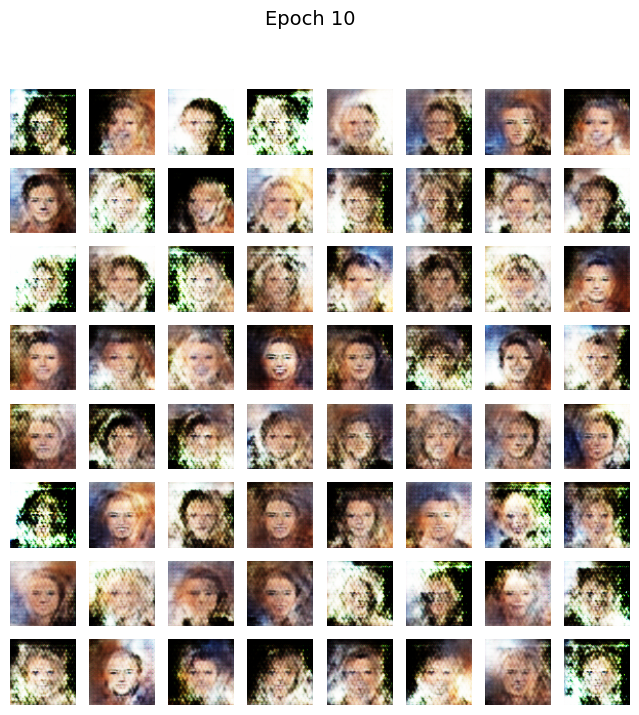

Epoch 11/100 | Generator Loss: 1.3659 | Discriminator Loss: 0.9787
Epoch 12/100 | Generator Loss: 1.4563 | Discriminator Loss: 0.9752
Epoch 13/100 | Generator Loss: 1.5051 | Discriminator Loss: 0.9551
Epoch 14/100 | Generator Loss: 1.4445 | Discriminator Loss: 0.9681
Epoch 15/100 | Generator Loss: 1.5044 | Discriminator Loss: 0.9549


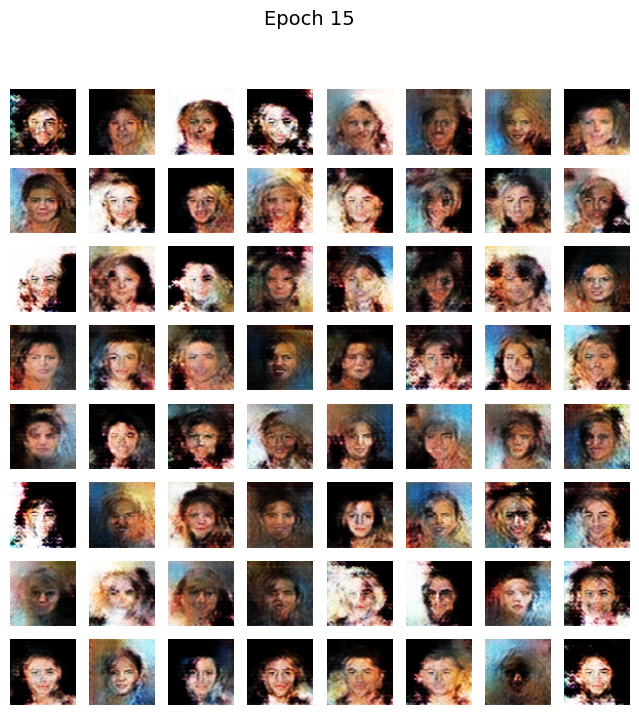

Epoch 16/100 | Generator Loss: 1.4784 | Discriminator Loss: 0.9426
Epoch 17/100 | Generator Loss: 1.5089 | Discriminator Loss: 0.9390
Epoch 18/100 | Generator Loss: 1.5584 | Discriminator Loss: 0.9120
Epoch 19/100 | Generator Loss: 1.5609 | Discriminator Loss: 0.9333
Epoch 20/100 | Generator Loss: 1.5519 | Discriminator Loss: 0.9175


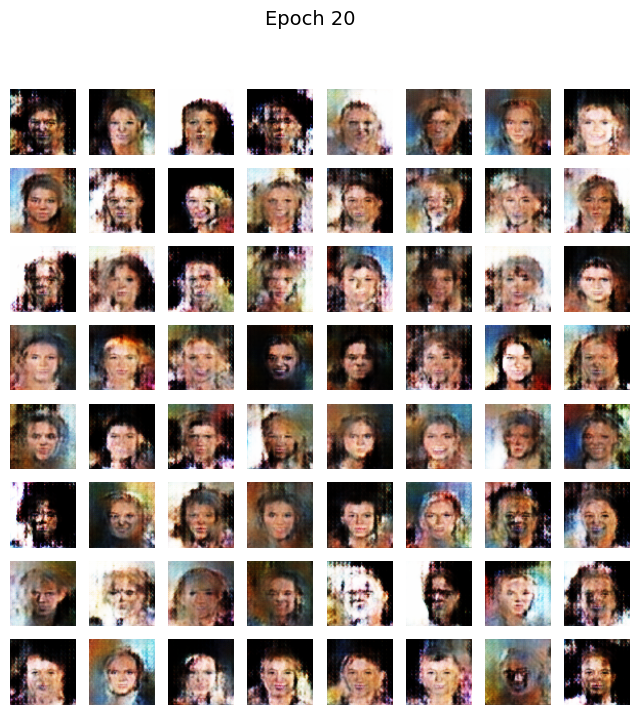

Epoch 21/100 | Generator Loss: 1.6040 | Discriminator Loss: 0.9083
Epoch 22/100 | Generator Loss: 1.5711 | Discriminator Loss: 0.9187
Epoch 23/100 | Generator Loss: 1.5541 | Discriminator Loss: 0.9371
Epoch 24/100 | Generator Loss: 1.5467 | Discriminator Loss: 0.9347
Epoch 25/100 | Generator Loss: 1.5273 | Discriminator Loss: 0.9358


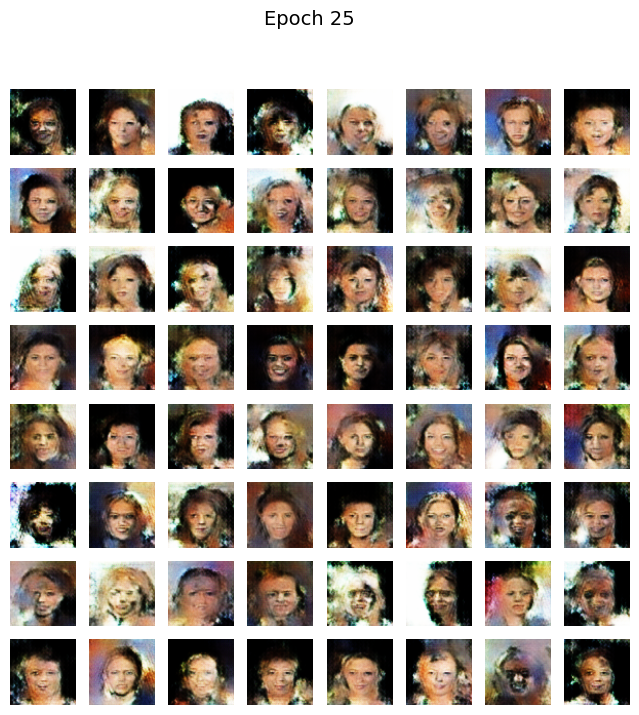

Epoch 26/100 | Generator Loss: 1.5613 | Discriminator Loss: 0.9268
Epoch 27/100 | Generator Loss: 1.5734 | Discriminator Loss: 0.9233
Epoch 28/100 | Generator Loss: 1.5516 | Discriminator Loss: 0.9357
Epoch 29/100 | Generator Loss: 1.5036 | Discriminator Loss: 0.9465
Epoch 30/100 | Generator Loss: 1.5618 | Discriminator Loss: 0.9277


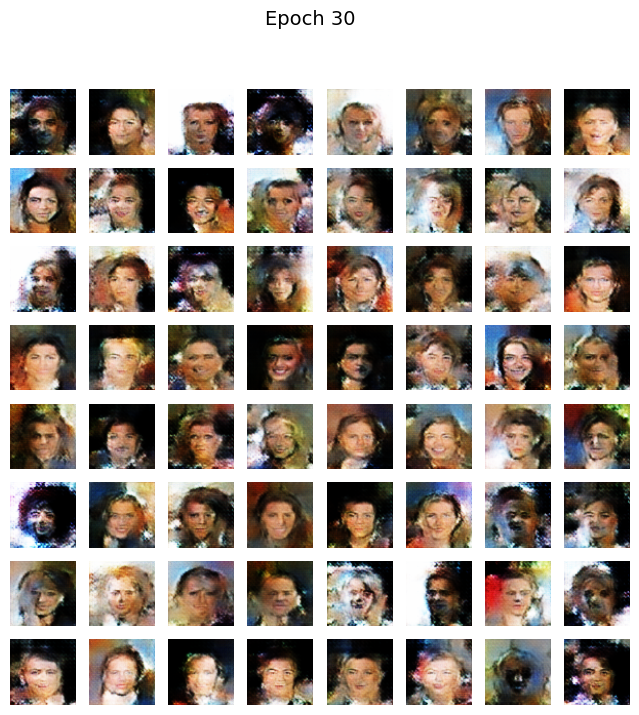

Epoch 31/100 | Generator Loss: 1.5112 | Discriminator Loss: 0.9367
Epoch 32/100 | Generator Loss: 1.5615 | Discriminator Loss: 0.9234
Epoch 33/100 | Generator Loss: 1.5185 | Discriminator Loss: 0.9388
Epoch 34/100 | Generator Loss: 1.5106 | Discriminator Loss: 0.9157
Epoch 35/100 | Generator Loss: 1.5865 | Discriminator Loss: 0.9073


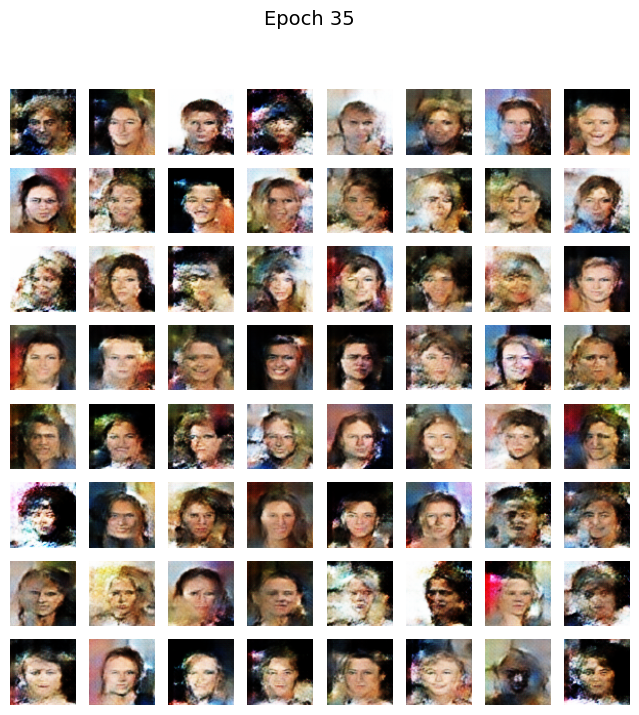

Epoch 36/100 | Generator Loss: 1.5517 | Discriminator Loss: 0.9258
Epoch 37/100 | Generator Loss: 1.5339 | Discriminator Loss: 0.9178
Epoch 38/100 | Generator Loss: 1.5502 | Discriminator Loss: 0.9631
Epoch 39/100 | Generator Loss: 1.5282 | Discriminator Loss: 0.9420
Epoch 40/100 | Generator Loss: 1.5227 | Discriminator Loss: 0.9745


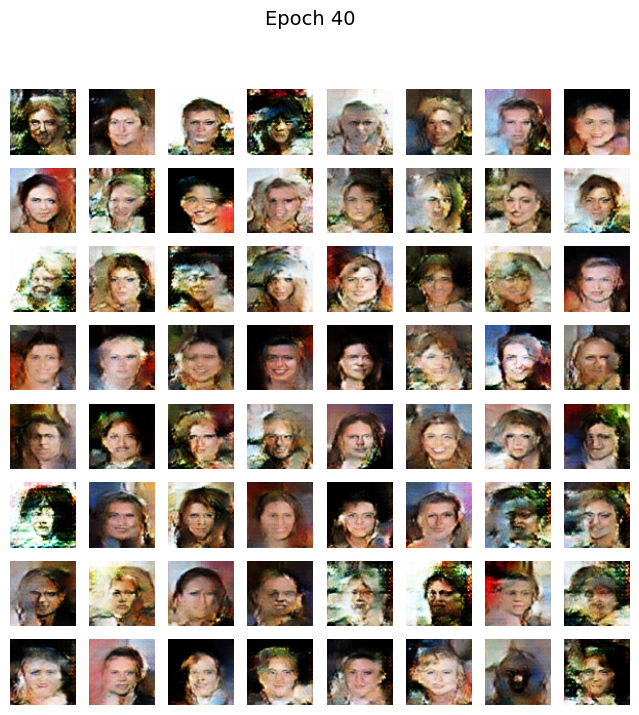

Epoch 41/100 | Generator Loss: 1.4619 | Discriminator Loss: 0.9892
Epoch 42/100 | Generator Loss: 1.4674 | Discriminator Loss: 0.9599
Epoch 43/100 | Generator Loss: 1.4359 | Discriminator Loss: 0.9963
Epoch 44/100 | Generator Loss: 1.4410 | Discriminator Loss: 1.0031
Epoch 45/100 | Generator Loss: 1.4419 | Discriminator Loss: 0.9975


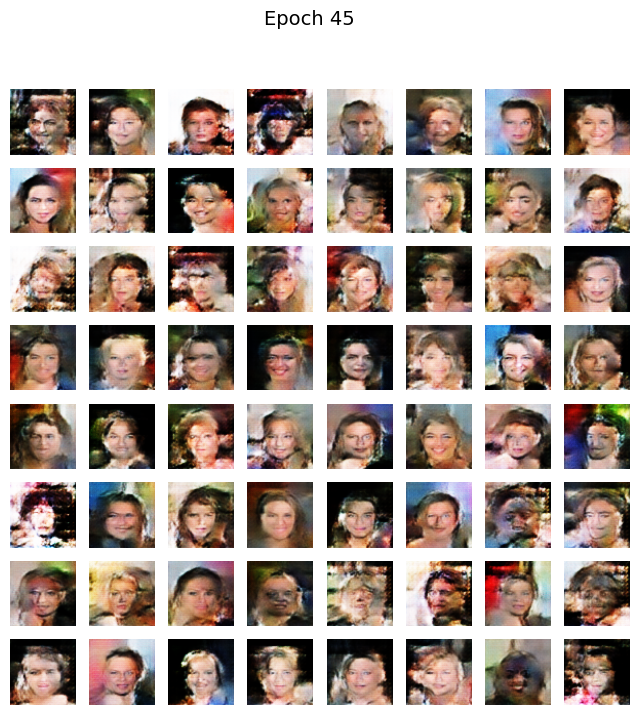

Epoch 46/100 | Generator Loss: 1.4145 | Discriminator Loss: 1.0122
Epoch 47/100 | Generator Loss: 1.4246 | Discriminator Loss: 0.9997
Epoch 48/100 | Generator Loss: 1.4492 | Discriminator Loss: 0.9600
Epoch 49/100 | Generator Loss: 1.4707 | Discriminator Loss: 0.9728
Epoch 50/100 | Generator Loss: 1.4890 | Discriminator Loss: 0.9702


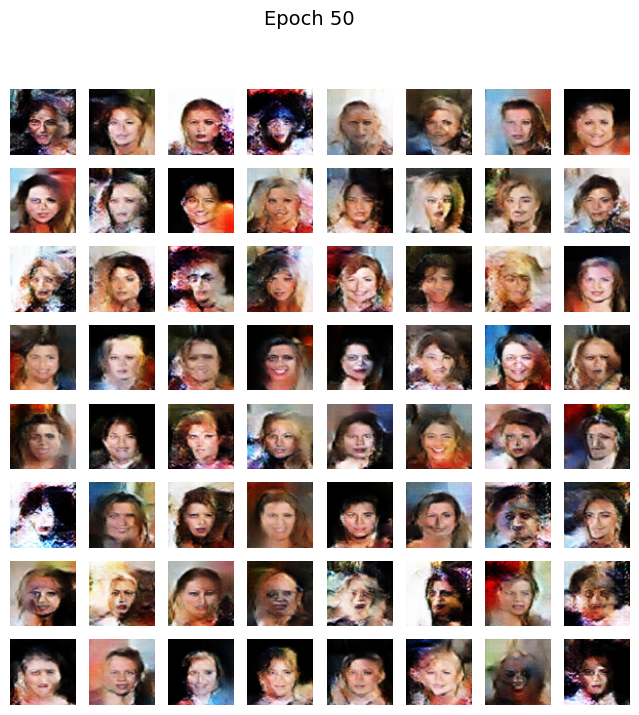

Epoch 51/100 | Generator Loss: 1.4557 | Discriminator Loss: 1.0005
Epoch 52/100 | Generator Loss: 1.4514 | Discriminator Loss: 0.9878
Epoch 53/100 | Generator Loss: 1.4232 | Discriminator Loss: 0.9801
Epoch 54/100 | Generator Loss: 1.4438 | Discriminator Loss: 0.9999
Epoch 55/100 | Generator Loss: 1.4395 | Discriminator Loss: 0.9794


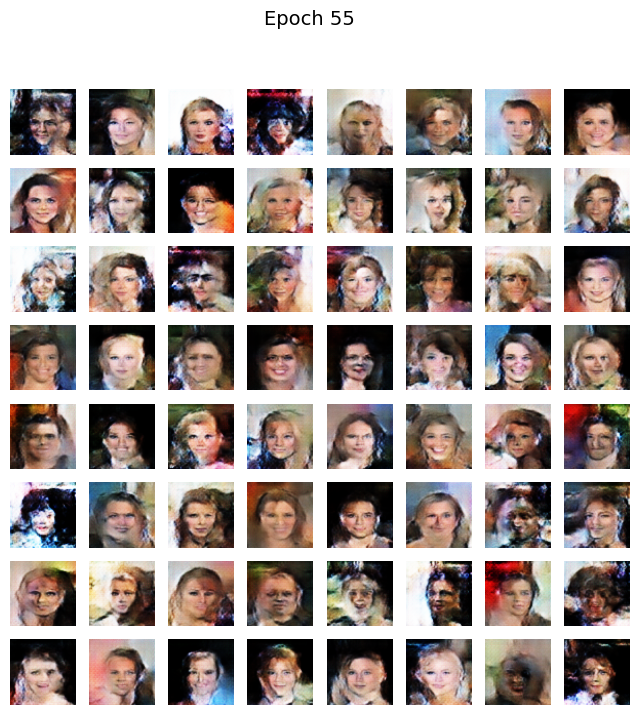

Epoch 56/100 | Generator Loss: 1.4434 | Discriminator Loss: 0.9859
Epoch 57/100 | Generator Loss: 1.4773 | Discriminator Loss: 0.9861
Epoch 58/100 | Generator Loss: 1.4442 | Discriminator Loss: 0.9805
Epoch 59/100 | Generator Loss: 1.4509 | Discriminator Loss: 0.9763
Epoch 60/100 | Generator Loss: 1.4603 | Discriminator Loss: 1.0014


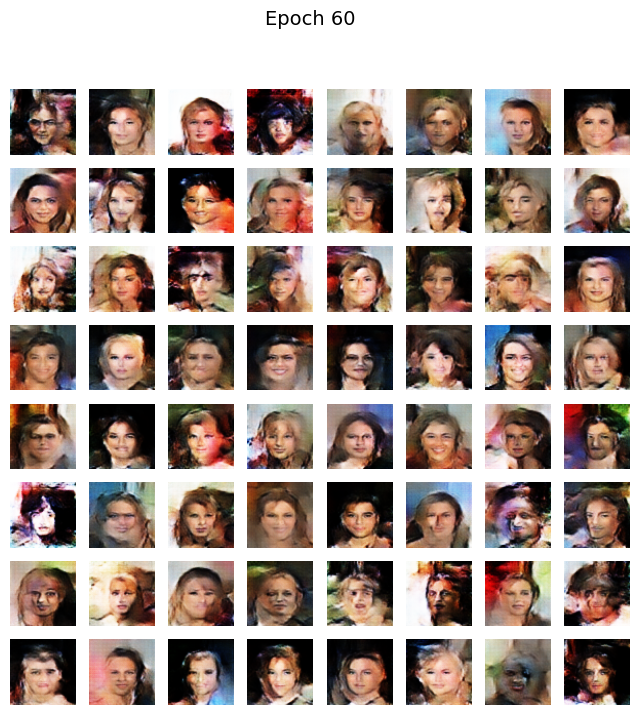

Epoch 61/100 | Generator Loss: 1.4074 | Discriminator Loss: 1.0198
Epoch 62/100 | Generator Loss: 1.3812 | Discriminator Loss: 1.0246
Epoch 63/100 | Generator Loss: 1.3772 | Discriminator Loss: 1.0047
Epoch 64/100 | Generator Loss: 1.3620 | Discriminator Loss: 1.0313
Epoch 65/100 | Generator Loss: 1.3828 | Discriminator Loss: 1.0216


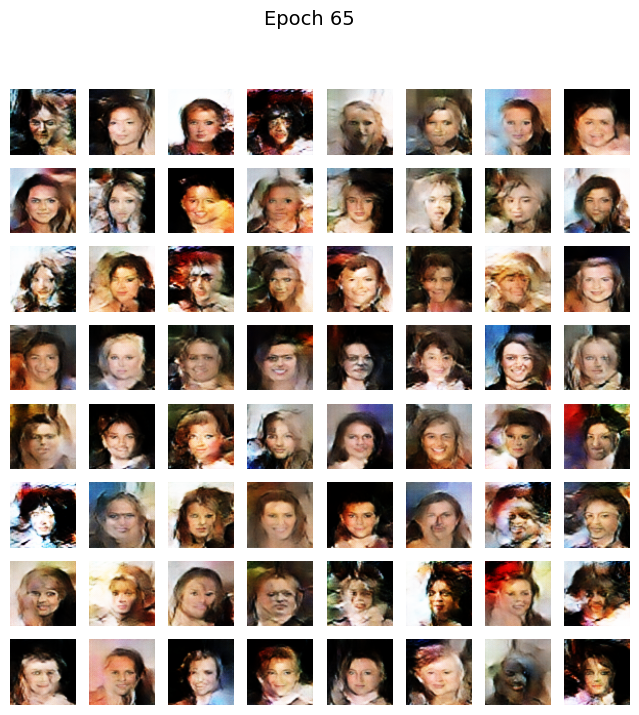

Epoch 66/100 | Generator Loss: 1.3694 | Discriminator Loss: 1.0176
Epoch 67/100 | Generator Loss: 1.3784 | Discriminator Loss: 1.0435
Epoch 68/100 | Generator Loss: 1.3489 | Discriminator Loss: 1.0236
Epoch 69/100 | Generator Loss: 1.3853 | Discriminator Loss: 0.9997
Epoch 70/100 | Generator Loss: 1.4058 | Discriminator Loss: 0.9981


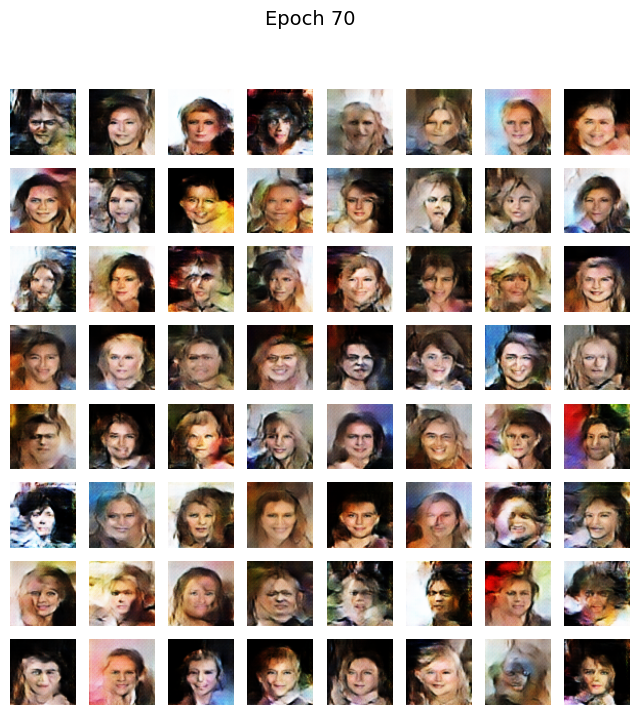

Epoch 71/100 | Generator Loss: 1.3638 | Discriminator Loss: 1.0394
Epoch 72/100 | Generator Loss: 1.3300 | Discriminator Loss: 1.0331
Epoch 73/100 | Generator Loss: 1.3800 | Discriminator Loss: 0.9897
Epoch 74/100 | Generator Loss: 1.4383 | Discriminator Loss: 0.9709
Epoch 75/100 | Generator Loss: 1.3473 | Discriminator Loss: 1.0370


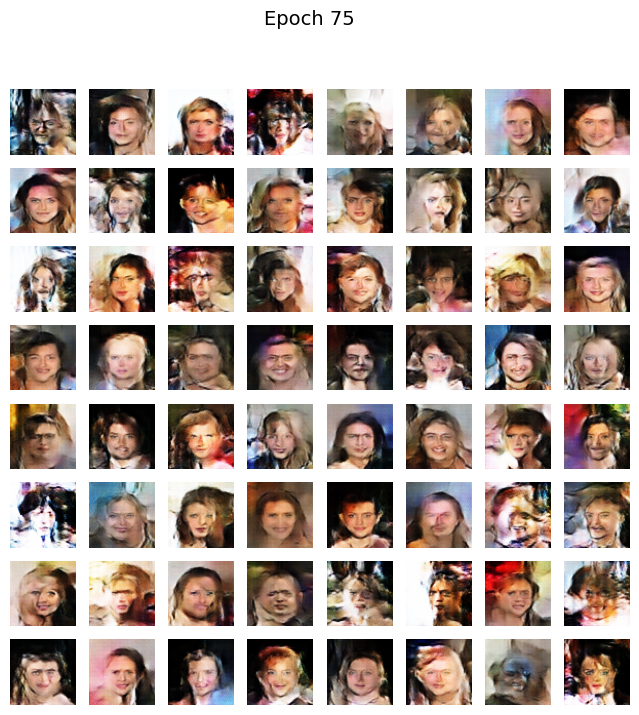

Epoch 76/100 | Generator Loss: 1.3791 | Discriminator Loss: 1.0067
Epoch 77/100 | Generator Loss: 1.3908 | Discriminator Loss: 0.9980
Epoch 78/100 | Generator Loss: 1.3565 | Discriminator Loss: 1.0198
Epoch 79/100 | Generator Loss: 1.3492 | Discriminator Loss: 1.0312
Epoch 80/100 | Generator Loss: 1.3456 | Discriminator Loss: 1.0345


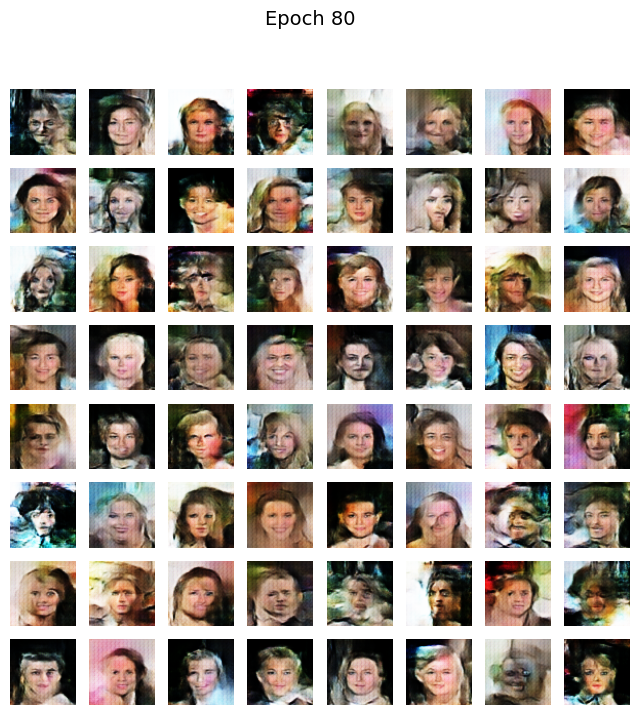

Epoch 81/100 | Generator Loss: 1.3782 | Discriminator Loss: 1.0067
Epoch 82/100 | Generator Loss: 1.3451 | Discriminator Loss: 1.0296
Epoch 83/100 | Generator Loss: 1.3706 | Discriminator Loss: 1.0110
Epoch 84/100 | Generator Loss: 1.3990 | Discriminator Loss: 1.0168
Epoch 85/100 | Generator Loss: 1.4317 | Discriminator Loss: 0.9776


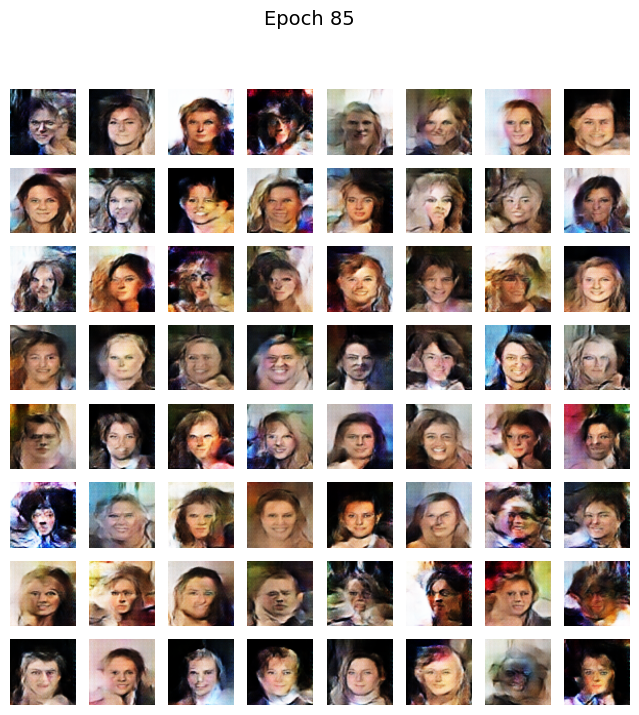

Epoch 86/100 | Generator Loss: 1.3398 | Discriminator Loss: 1.0469
Epoch 87/100 | Generator Loss: 1.3628 | Discriminator Loss: 1.0100
Epoch 88/100 | Generator Loss: 1.3687 | Discriminator Loss: 1.0173
Epoch 89/100 | Generator Loss: 1.3563 | Discriminator Loss: 1.0237
Epoch 90/100 | Generator Loss: 1.3735 | Discriminator Loss: 1.0206


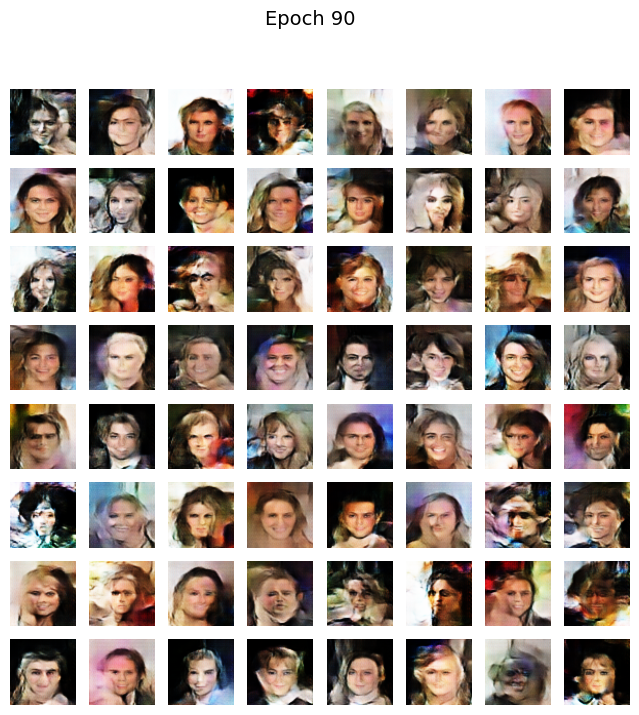

Epoch 91/100 | Generator Loss: 1.3318 | Discriminator Loss: 1.0248
Epoch 92/100 | Generator Loss: 1.3649 | Discriminator Loss: 1.0030
Epoch 93/100 | Generator Loss: 1.3432 | Discriminator Loss: 1.0306
Epoch 94/100 | Generator Loss: 1.3739 | Discriminator Loss: 1.0143
Epoch 95/100 | Generator Loss: 1.3991 | Discriminator Loss: 0.9731


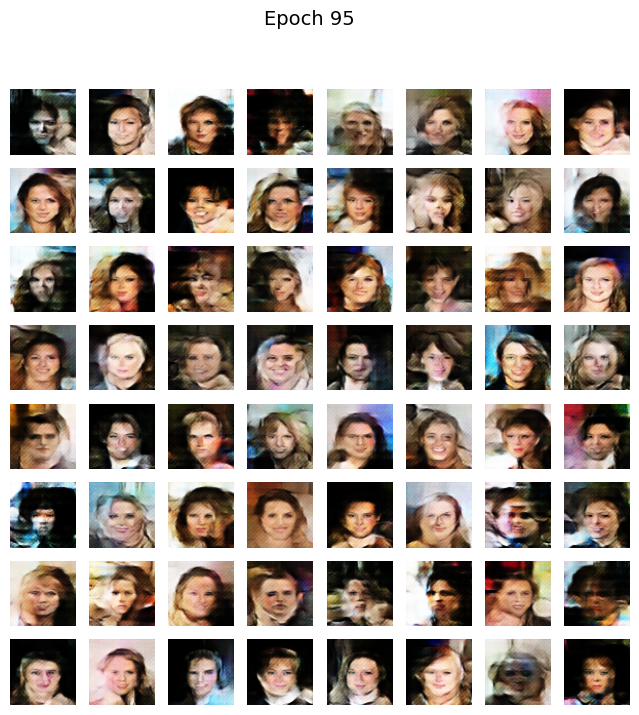

Epoch 96/100 | Generator Loss: 1.6077 | Discriminator Loss: 0.8963
Epoch 97/100 | Generator Loss: 1.3904 | Discriminator Loss: 1.0240
Epoch 98/100 | Generator Loss: 1.3711 | Discriminator Loss: 1.0132
Epoch 99/100 | Generator Loss: 1.3774 | Discriminator Loss: 1.0269
Epoch 100/100 | Generator Loss: 1.3505 | Discriminator Loss: 1.0472


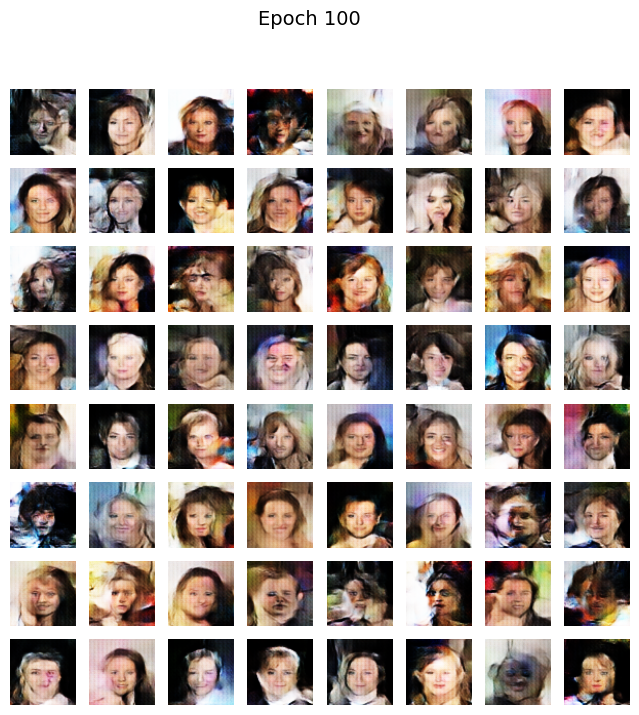

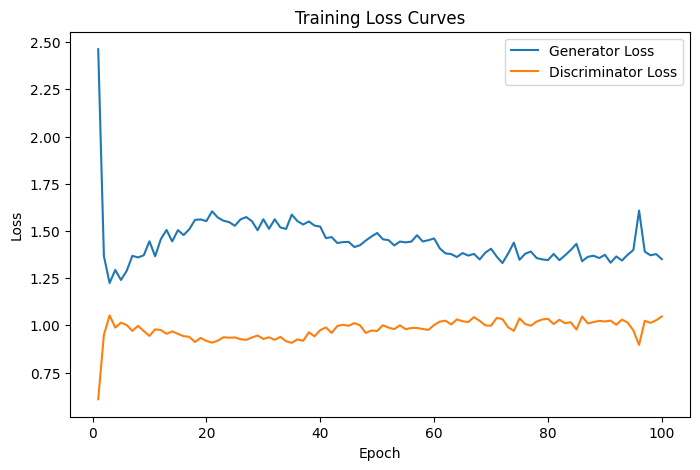

In [7]:
# For tracking losses and best epoch
gen_losses = []
disc_losses = []

seed = tf.random.normal([64, LATENT_DIM])

def generate_and_plot_images(model, epoch, test_input, save=False):
    predictions = model(test_input, training=False)
    predictions = (predictions + 1) / 2.0  # Rescale to [0, 1]

    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(8, 8, i + 1)
        plt.imshow(predictions[i])
        plt.axis('off')
    plt.suptitle(f'Epoch {epoch}', fontsize=14)
    plt.show()

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, LATENT_DIM]) # (noise shape = images shape)

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True) #forward pass

        real_output = discriminator(images, training=True) #forward pass
        fake_output = discriminator(generated_images, training=True) #forward pass

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

def train(dataset, epochs):
    for epoch in range(1, epochs + 1):
        epoch_gen_loss = 0.0
        epoch_disc_loss = 0.0
        batch_count = 0

        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
            epoch_gen_loss += gen_loss.numpy()
            epoch_disc_loss += disc_loss.numpy()
            batch_count += 1

        avg_gen_loss = epoch_gen_loss / batch_count
        avg_disc_loss = epoch_disc_loss / batch_count

        gen_losses.append(avg_gen_loss)
        disc_losses.append(avg_disc_loss)

        print(f"Epoch {epoch}/{epochs} | Generator Loss: {avg_gen_loss:.4f} | Discriminator Loss: {avg_disc_loss:.4f}")

        # Show generated images every 5 epochs
        if epoch % 5 == 0 or epoch==1:
            generate_and_plot_images(generator, epoch, seed)

    # Plot training loss curves
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, epochs + 1), gen_losses, label='Generator Loss')
    plt.plot(range(1, epochs + 1), disc_losses, label='Discriminator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss Curves')
    plt.legend()
    plt.show()

train(dataset, EPOCHS)
